#Import Library

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sn
from matplotlib import pyplot as plt
from sklearn.preprocessing import LabelEncoder
from google.colab import files
from sklearn.model_selection import train_test_split
from pandas import DataFrame
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import precision_recall_fscore_support
from scipy import stats
from sklearn import metrics
from imblearn.over_sampling import SMOTE
from sklearn.metrics import precision_recall_fscore_support

#Load Data

In [ ]:
data = pd.read_csv('dataset.csv')
data.sort_values(by=['host_id'])

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (50,51,52,53,54,55,56,57,58,62,63,64,66,69,70,78,79,81,82,83,84,85) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,id,host_id,host_name,host_response_time,host_response_rate,host_acceptance_rate,host_neighbourhood,host_listings_count,host_total_listings_count,neighbourhood,neighbourhood_cleansed,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,number_of_reviews,number_of_reviews_ltm,review_scores_rating,reviews_per_month,Unnamed: 30,Unnamed: 31,Unnamed: 32,Unnamed: 33,Unnamed: 34,Unnamed: 35,Unnamed: 36,Unnamed: 37,Unnamed: 38,Unnamed: 39,...,Unnamed: 51,Unnamed: 52,Unnamed: 53,Unnamed: 54,Unnamed: 55,Unnamed: 56,Unnamed: 57,Unnamed: 58,Unnamed: 59,Unnamed: 60,Unnamed: 61,Unnamed: 62,Unnamed: 63,Unnamed: 64,Unnamed: 65,Unnamed: 66,Unnamed: 67,Unnamed: 68,Unnamed: 69,Unnamed: 70,Unnamed: 71,Unnamed: 72,Unnamed: 73,Unnamed: 74,Unnamed: 75,Unnamed: 76,Unnamed: 77,Unnamed: 78,Unnamed: 79,Unnamed: 80,Unnamed: 81,Unnamed: 82,Unnamed: 83,Unnamed: 84,Unnamed: 85,Unnamed: 86,Unnamed: 87,Unnamed: 88,Unnamed: 89,Unnamed: 90
6618,32998249,(Website hidden by Airbnb) ※ﾚｽﾄﾗﾝはﾗｰﾒﾝ､鉄板焼き､...,【最寄駅】 最寄駅はJR常磐線&千代田線｢亀有駅｣です｡JRﾊﾟｽを使うことができます｡駅か...,NaN,NaN,https://a0.muscache.com/im/pictures/04fa69e1-9...,Kayo,2016-08-22,"Chuo City, Tokyo, Japan",t,https://a0.muscache.com/im/pictures/user/71214...,Katsushika-ku,Tōkyō-to,125-0061,Tokyo,"Katsushika-ku , Japan",JP,f,3,4,Real Bed,"{TV,Wifi,""Air conditioning"",Kitchen,""Paid park...",NaN,"$13,049.00",NaN,NaN,1125,1.2,t,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7092,33998045,(Website hidden by Airbnb) ※ﾚｽﾄﾗﾝはﾗｰﾒﾝ､鉄板焼き､...,【最寄駅】 最寄駅はJR常磐線&千代田線｢亀有駅｣です｡JRﾊﾟｽを使うことができます｡駅か...,NaN,NaN,https://a0.muscache.com/im/pictures/ab7ea624-b...,Kayo,2016-08-22,"Chuo City, Tokyo, Japan",t,https://a0.muscache.com/im/pictures/user/71214...,Katsushika City,Tokyo,125-0061,Tokyo,"Katsushika City, Japan",JP,t,3,4,Real Bed,"{TV,Wifi,""Air conditioning"",Kitchen,""Paid park...",NaN,"$8,984.00",NaN,NaN,1125,30,t,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4598,29135704,There is a FREE Portable Wi-Fi !!,It's your own private apartment & fully furni...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Access】,From JR Nishi-shinjuku-gochōme station to: (W...,NaN,NaN,NaN,NaN,NaN,https://www.airbnb.com/users/show/96361779,within an hour,100%,99%,f,https://a0.muscache.com/im/pictures/user/6d8e2...,https://a0.muscache.com/im/pictures/user/6d8e2...,Nakano District,4,Tōkyō-to,151-0071,JP,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12488,42542871,Tsukiji market,Ginza,Ikebukuro,20mn,Shibuya,Disneyland,21mn (1 change),Haneda Airport,We will send you the route map and how to chec...,NaN,97%,100%,f,https://a0.muscache.com/im/pictures/user/a2b0e...,https://a0.muscache.com/im/pictures/user/a2b0e...,Chiyoda District,t,NaN,Chiyoda City,Tōkyō-to,101-0031,Tokyo,"Chiyoda City, Japan",JP,Japan,Real Bed,"{TV,Wifi,""Air conditioning"",Kitchen,Heating,Wa...",NaN,227,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9092,38275341,Tsukiji market,Ginza,Ikebukuro,20mn,Shibuya,Disneyland,21mn (1 change),Haneda Airport,We will send you the route map and how to chec...,NaN,97%,100%,f,https://a0.muscache.com/im/pictures/user/a2b0e...,https://a0.muscache.com/im/pictures/user/a2b0e...,Chiyoda District,t,NaN,Chiyoda City,Tōkyō-to,101-0031,Tokyo,"Chiyoda City, Japan",JP,Japan,Real Bed,"{TV,Wifi,""Air con

In [ ]:
data.columns

Index(['id', 'host_id', 'host_name', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_neighbourhood',
       'host_listings_count', 'host_total_listings_count', 'neighbourhood',
       'neighbourhood_cleansed', 'property_type', 'room_type', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'price', 'guests_included',
       'extra_people', 'minimum_nights', 'maximum_nights',
       'minimum_minimum_nights', 'maximum_minimum_nights',
       'minimum_maximum_nights', 'maximum_maximum_nights', 'number_of_reviews',
       'number_of_reviews_ltm', 'review_scores_rating', 'reviews_per_month',
       'Unnamed: 30', 'Unnamed: 31', 'Unnamed: 32', 'Unnamed: 33',
       'Unnamed: 34', 'Unnamed: 35', 'Unnamed: 36', 'Unnamed: 37',
       'Unnamed: 38', 'Unnamed: 39', 'Unnamed: 40', 'Unnamed: 41',
       'Unnamed: 42', 'Unnamed: 43', 'Unnamed: 44', 'Unnamed: 45',
       'Unnamed: 46', 'Unnamed: 47', 'Unnamed: 48', 'Unnamed: 49',
       'Unnamed: 50', 'Unnamed: 5

# Choosing 12 Main Features

In [ ]:
pick_features = [
            #  'id',
             'host_id',
            #  'host_name',
            #  'host_response_time',
            #  'host_response_rate',
             'host_acceptance_rate',
            #  'host_neighbourhood',
            #  'host_listings_count',
             'host_total_listings_count',
            #  'neighbourhood',
             'neighbourhood_cleansed',
             'property_type',
             'room_type',
             'accommodates',
            #  'bathrooms',
             'bedrooms',
            #  'beds',
            #  'price',                                      #target
            #  'guests_included',
             'extra_people',
            #  'minimum_nights',
            #  'maximum_nights',
            #  'minimum_minimum_nights',
            #  'maximum_minimum_nights',
            #  'minimum_maximum_nights',
            #  'maximum_maximum_nights',
             'number_of_reviews',
             'number_of_reviews_ltm',
            #  'review_scores_rating',                      #target
             'reviews_per_month'
]

pick_targets = [
            'price',
            'review_scores_rating',
]

In [ ]:
X = data[pick_features]
Y = data[pick_targets]

In [ ]:
data_pick = pd.concat([X,Y],axis=1)

In [ ]:
data_pick.dtypes

host_id                      object
host_acceptance_rate         object
host_total_listings_count    object
neighbourhood_cleansed       object
property_type                object
room_type                    object
accommodates                 object
bedrooms                     object
extra_people                 object
number_of_reviews            object
number_of_reviews_ltm        object
reviews_per_month            object
price                        object
review_scores_rating         object
dtype: object

In [ ]:
data_pick.describe().T

,count,unique,top,freq
host_id,12811,3101,258668827,98
host_acceptance_rate,12729,120,100%,8487
host_total_listings_count,13028,111,1,1145
neighbourhood_cleansed,13019,112,Shinjuku Ku,2346
property_type,13048,110,Apartment,7697
room_type,13045,62,Entire home/apt,8937
accommodates,13046,52,2,3141
bedrooms,13028,70,1,8439
extra_people,13027,267,$0.00,4495
number_of_reviews,13049,290,0,1929


# Features Engineering

## Casting/Converting to Proper Data Type

semua kolom pada DataFrame masih bertipe data Object, sehingga belum bisa digunakan dalam model ML. Oleh karena itu, pada tahap ini, setiap kolom di casting tipe datanya sehingga sesuai dan dapat digunakan pada model.

**casting yang gagal akan menghasilkan nilai Nan

In [ ]:
data_pick['price'] = pd.to_numeric(data_pick['price'].replace('[\$,]', '', regex=True), errors='coerce')
data_pick['extra_people'] = pd.to_numeric(data_pick['extra_people'].replace('[\$,]', '', regex=True), errors='coerce')
data_pick['host_acceptance_rate'] = pd.to_numeric(data_pick['host_acceptance_rate'].replace('[\%]', '', regex=True), errors='coerce')
data_pick

,host_id,host_acceptance_rate,host_total_listings_count,neighbourhood_cleansed,property_type,room_type,accommodates,bedrooms,extra_people,number_of_reviews,number_of_reviews_ltm,reviews_per_month,price,review_scores_rating
0,151977,NaN,3,Shibuya Ku,Apartment,Private room,1,1,0.0,18,0,0.18,4183.0,94
1,964081,88.0,1,Sumida Ku,Apartment,Entire home/apt,2,1,0.0,165,11,1.57,11048.0,95
2,341577,82.0,2,Nerima Ku,Apartment,Entire home/apt,2,1,1070.0,113,7,1.18,4171.0,95
3,1573631,93.0,3,Setagaya Ku,Apartment,Entire home/apt,2,0,0.0,103,5,1.39,6952.0,95
4,341577,82.0,2,Nerima Ku,Apartment,Entire home/apt,2,1,1070.0,103,3,1.12,3957.0,96
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13044,191971770,NaN,3,Chiyoda Ku,Hostel,Private room,2,1,0.0,0,0,NaN,5027.0,NaN
13045,191971770,NaN,3,Chiyoda Ku,Hostel,Private room,3,1,0.0,0,0,NaN,5455.0,NaN
13046,335257890,100.0,0,Shinjuku Ku,Hotel,Private room,1,1,0.0,0,0,NaN,6972.0,NaN
13047,333948576,NaN,0,Shibuya Ku,House,Entire home/apt,15,3,0.0,0,0,NaN,24992.0,NaN


In [ ]:
integer_columns = [
                  'host_id',
                  'host_acceptance_rate',
                  'host_total_listings_count',
                  # 'neighbourhood_cleansed',
                  # 'property_type',
                  # 'room_type',
                  'accommodates',
                  'bedrooms',
                  'extra_people',
                  'number_of_reviews',
                  'number_of_reviews_ltm',
                  'reviews_per_month',
                  'review_scores_rating',
                  'price'

]

for col in integer_columns:
  data_pick[col] = pd.to_numeric(data_pick[col], errors='coerce')

data_pick

,host_id,host_acceptance_rate,host_total_listings_count,neighbourhood_cleansed,property_type,room_type,accommodates,bedrooms,extra_people,number_of_reviews,number_of_reviews_ltm,reviews_per_month,price,review_scores_rating
0,151977.0,NaN,3.0,Shibuya Ku,Apartment,Private room,1.0,1.0,0.0,18.0,0.0,0.18,4183.0,94.0
1,964081.0,88.0,1.0,Sumida Ku,Apartment,Entire home/apt,2.0,1.0,0.0,165.0,11.0,1.57,11048.0,95.0
2,341577.0,82.0,2.0,Nerima Ku,Apartment,Entire home/apt,2.0,1.0,1070.0,113.0,7.0,1.18,4171.0,95.0
3,1573631.0,93.0,3.0,Setagaya Ku,Apartment,Entire home/apt,2.0,0.0,0.0,103.0,5.0,1.39,6952.0,95.0
4,341577.0,82.0,2.0,Nerima Ku,Apartment,Entire home/apt,2.0,1.0,1070.0,103.0,3.0,1.12,3957.0,96.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13044,191971770.0,NaN,3.0,Chiyoda Ku,Hostel,Private room,2.0,1.0,0.0,0.0,0.0,NaN,5027.0,NaN
13045,191971770.0,NaN,3.0,Chiyoda Ku,Hostel,Private room,3.0,1.0,0.0,0.0,0.0,NaN,5455.0,NaN
13046,335257890.0,100.0,0.0,Shinjuku Ku,Hotel,Private room,1.0,1.0,0.0,0.0,0.0,NaN,6972.0,NaN
13047,333948576.0,NaN,0.0,Shibuya Ku,House,Entire home/apt,15.0,3.0,0.0,0.0,0.0,NaN,24992.0,NaN


**Pick Raw Data**

Untuk menunjukan perbedaan hasil dari data yang telah di Feature Engineering lebih lanjut dengan yang tidak (hanya di casting dan semua buang semua yang kosong supaya bisa digunakan dalam model), maka di simpan salinan data yang masih belum di apa-apakan. 

In [ ]:
data_pick_raw = data_pick.copy()
data_pick_raw = data_pick_raw.dropna()

labelencoder = LabelEncoder()
data_pick_raw['neighbourhood_cleansed'] = labelencoder.fit_transform(data_pick_raw['neighbourhood_cleansed'])
data_pick_raw['property_type'] = labelencoder.fit_transform(data_pick_raw['property_type'])
data_pick_raw['room_type'] = labelencoder.fit_transform(data_pick_raw['room_type'])

## Dealing with Mising Value on Features

### check and count missing value

In [ ]:
data_pick.isna().sum()

host_id                       338
host_acceptance_rate          428
host_total_listings_count     136
neighbourhood_cleansed         30
property_type                   1
room_type                       4
accommodates                  325
bedrooms                       91
extra_people                   36
number_of_reviews             231
number_of_reviews_ltm          55
reviews_per_month            1977
price                         297
review_scores_rating         2207
dtype: int64

Dari hasil di atas, dapat dilihat bahwa setiap kolom memiliki nilai Nan, oleh karena itu pertama-tama saya membuang semua baris yang lebih dari 25% kolomnya Nan. Terlalu banyak kolom yang Nan pada suatu baris akan membuat 1 baris data tersebut tidak bermakna dan malah dapat mengacaukan model.

### keep row with 75% or higher non NaN value

In [ ]:
#total row with more than 25% missing value on features
data_pick.shape[0]- data_pick.dropna(subset= pick_features, thresh=9).shape[0]

155

In [ ]:
data_pick = data_pick.dropna(subset= pick_features, thresh=9)
data_pick = data_pick.reset_index(drop = True)

In [ ]:
#count of missing values on each column
data_pick.isna().sum()

host_id                       183
host_acceptance_rate          295
host_total_listings_count       0
neighbourhood_cleansed          0
property_type                   0
room_type                       0
accommodates                  183
bedrooms                       18
extra_people                    0
number_of_reviews             183
number_of_reviews_ltm           0
reviews_per_month            1920
price                         183
review_scores_rating         2124
dtype: int64

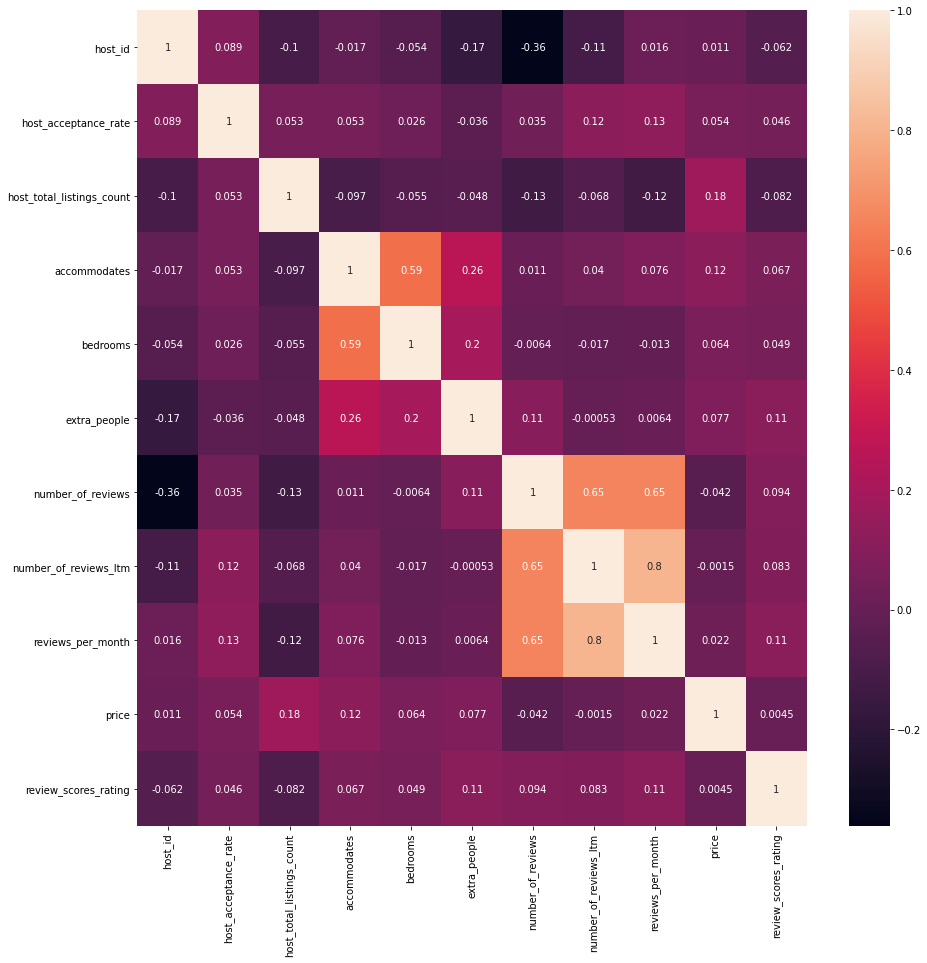

In [ ]:
df = DataFrame(data_pick)

corrMatrix = df.corr()
plt.figure(figsize=(15, 15)) 
sn.heatmap(corrMatrix, annot=True)


In [ ]:
data_pick.isna().sum()

host_id                       183
host_acceptance_rate          295
host_total_listings_count       0
neighbourhood_cleansed          0
property_type                   0
room_type                       0
accommodates                  183
bedrooms                       18
extra_people                    0
number_of_reviews             183
number_of_reviews_ltm           0
reviews_per_month            1920
price                         183
review_scores_rating         2124
dtype: int64

Setelah membuang baris-baris yang memiliki banyak kolom Nan, masih tersisa kolom-kolom yang memiliki nilai Nan. Salah satunya adalah kolom 'price' yang mana merupakan target rergresi. Namun, banyaknya Nan pada kolom 'price' tidaklah banyak (183) sehingga saya memutuskan untuk membuang semua baris yang kolom 'price'-nya berisi nilai Nan

In [ ]:
data_pick = data_pick.dropna(subset= ['price'])
data_pick = data_pick.reset_index(drop = True)

In [ ]:
data_pick.isna().sum()

host_id                         0
host_acceptance_rate          295
host_total_listings_count       0
neighbourhood_cleansed          0
property_type                   0
room_type                       0
accommodates                    0
bedrooms                       18
extra_people                    0
number_of_reviews               0
number_of_reviews_ltm           0
reviews_per_month            1920
price                           0
review_scores_rating         1941
dtype: int64

Masih tersisa 4 kolom yang memiliki nilai Nan (salah satunya adalah target klasifikasi). Untuk 3 kolom yang merupakan feature, saya mengisinya dengan modus atau rata-rata dari kolom tersebut.

### fill Nan with mode on 'bedrooms'

untuk kolom 'bedrooms' semua nilai Nan diisi dengan modus (nilai yang paling banyak muncul) dari kolom tersebut

In [ ]:
data_pick['bedrooms'] = data_pick['bedrooms'].fillna(data_pick['bedrooms'].mode()[0])

### fill Nan with mean on 'host_acceptance_rate'

untuk kolom 'host_acceptance_rate' semua nilai Nan diisi dengan rata-rata dari rata-rata kolom tersebut

In [ ]:
data_pick['host_acceptance_rate'] = data_pick['host_acceptance_rate'].fillna(data_pick['host_acceptance_rate'].mean())

### fill Nan with groupby 'number_of_reviews_ltm' and 'number_of_reviews' mean on 'reviews_per_month'

untuk kolom 'reviews_per_month' semua nilai Nan diisi dengan rata-rata dari pengelompokan berdasarkan 'number_of_reviews_ltm' dan 'number_of_reviews' (karena memiliki korelasi paling tinggi dengan 'reviews_per_month').

Apabila nilai rata-rata kelompok masih Nan, maka akan di isi dari nilai rata-rata kolom 'reviews_per_month' yang telah dicoba diisi Nan-nya sebelumnya

In [ ]:
data_pick['reviews_per_month'] = data_pick.groupby(['number_of_reviews_ltm','number_of_reviews'])['reviews_per_month'].apply(lambda x: x.fillna(x.mean()))
data_pick['reviews_per_month'] = data_pick['reviews_per_month'].fillna(data_pick['reviews_per_month'].mean())

### check Nan of every column

In [ ]:
data_pick.isna().sum()

host_id                         0
host_acceptance_rate            0
host_total_listings_count       0
neighbourhood_cleansed          0
property_type                   0
room_type                       0
accommodates                    0
bedrooms                        0
extra_people                    0
number_of_reviews               0
number_of_reviews_ltm           0
reviews_per_month               0
price                           0
review_scores_rating         1941
dtype: int64

Semua feature sudah tidak terdapat Nan

## Label Encoding

Data yang masih bertipe Object tidak dapat digunakan/diproses pada model, sehingga pada tahap ini dilakukan label encoding sehingga data categorial dapat di representasikan dalam bentuk bilangan bulat nantinya.

### check data type of every column

In [ ]:
data_pick.dtypes

host_id                      float64
host_acceptance_rate         float64
host_total_listings_count    float64
neighbourhood_cleansed        object
property_type                 object
room_type                     object
accommodates                 float64
bedrooms                     float64
extra_people                 float64
number_of_reviews            float64
number_of_reviews_ltm        float64
reviews_per_month            float64
price                        float64
review_scores_rating         float64
dtype: object

### split 'neighbourhood_cleansed' into 'neighbourhood_first' and 'neighbourhood_last'

kolom 'neighbourhood_cleansed' merupakan String dengan 2 kata, sehingga saya memilih untuk memisahkannya menjadi 2 kolom baru:


*   'neighbourhood_first' -> untuk kata pertama
*   'neighbourhood_last' -> untuk kata kedua




In [ ]:
tmp_first = []
tmp_last = []

for neighbourhood in data_pick['neighbourhood_cleansed']:
  first, last = neighbourhood.split(" ", 1)
  tmp_first.append(first)
  tmp_last.append(last)

data_pick['neighbourhood_first'] = tmp_first
data_pick['neighbourhood_last'] = tmp_last
data_pick = data_pick.drop(columns=['neighbourhood_cleansed'])

### encoding

In [ ]:
labelencoder = LabelEncoder()

data_pick['neighbourhood_first'] = labelencoder.fit_transform(data_pick['neighbourhood_first'])
data_pick['property_type'] = labelencoder.fit_transform(data_pick['property_type'])
data_pick['neighbourhood_last'] = labelencoder.fit_transform(data_pick['neighbourhood_last'])
data_pick['room_type'] = labelencoder.fit_transform(data_pick['room_type'])
data_pick['host_id'] = labelencoder.fit_transform(data_pick['host_id'])

## Dealing with Missing Value on Targets

Masih terdapat nilai Nan pada target klasifikasi. Karena jumlahnya cukup banyak (1941), maka saya tidak membuangnya begitu saja tetapi mencoba mengisinya dengan menggunakan hasil prediksi dari model KNN

### fill Nan in 'review_scores_rating' using KNN

dipisahkan antara data yang 'review_scores_rating'-nya Nan dengan yang tidak. Selanjutnya,


*   Data yang 'review_scores_rating'-nya Nan -> Test Data
*   Data yang 'review_scores_rating'-nya tidak Nan -> Train Data



In [ ]:
data_without_label = data_pick[data_pick['review_scores_rating'].isna() == True]
data_without_label = data_without_label.reset_index(drop = True)

data_with_label = data_pick[data_pick['review_scores_rating'].isna() == False]
data_with_label = data_with_label.reset_index(drop = True) 

cari nilai K yang paling bagus dengan mencoba nilai K dari 1 - 50

In [ ]:
# error_rate = []

# x_train_tmp, x_test_tmp, y_train_tmp, y_test_tmp = train_test_split(data_with_label.drop(columns=['review_scores_rating','price']),
#                                                                     data_with_label['review_scores_rating'],
#                                                                     test_size = 0.2)


# prepro = preprocessing.StandardScaler()
# x_train_tmp = prepro.fit_transform(x_train_tmp)
# x_test_tmp = prepro.fit_transform(x_test_tmp)

# for i in range(1,50):
#   KNN = KNeighborsClassifier(n_neighbors=i)
#   KNN.fit(x_train_tmp, y_train_tmp)
#   prediction = KNN.predict(x_test_tmp)
#   error_rate.append(np.mean(prediction != y_test_tmp))

# plt.figure(figsize=(10,6))
# plt.plot(range(1,50),error_rate,color='blue', linestyle='dashed', marker='o', markerfacecolor='red', markersize=10)
# plt.title('Error Rate vs. K')
# plt.xlabel('K')
# plt.ylabel('Error Rate')

melakukan fitting model dengan nilai K terbaik dan melakukan prediksi untuk mengisi 'review_scores_rating' yang Nan

In [ ]:
KNN = KNeighborsClassifier(n_neighbors=37)
KNN.fit(data_with_label.drop(columns=['review_scores_rating','price']), data_with_label['review_scores_rating'])

pred = KNN.predict(data_without_label.drop(columns=['review_scores_rating','price']))

In [ ]:
data_without_label['review_scores_rating'] = pred

In [ ]:
data_pick = pd.concat([data_with_label,data_without_label])
data_pick = data_pick.reset_index(drop = True)

### check Nan value of every column

In [ ]:
data_pick.isna().sum()

host_id                      0
host_acceptance_rate         0
host_total_listings_count    0
property_type                0
room_type                    0
accommodates                 0
bedrooms                     0
extra_people                 0
number_of_reviews            0
number_of_reviews_ltm        0
reviews_per_month            0
price                        0
review_scores_rating         0
neighbourhood_first          0
neighbourhood_last           0
dtype: int64

sudah tidak ada data dengan nilai Nan lagi, baik di features maupun di targets

In [ ]:
# for i in data_pick.columns:
#   plt.figure(figsize=(7,5))
#   sn.distplot(data_pick[i])

In [ ]:
# pd.reset_option('display.max_rows')
# pd.reset_option('display.max_columns')
# pd.reset_option('display.width')
# pd.reset_option('display.max_colwidth')

In [ ]:
# pd.set_option('display.max_rows', None)
# pd.set_option('display.max_columns', None)
# pd.set_option('display.width', None)
# pd.set_option('display.max_colwidth', -1)

In [ ]:
data_pick.describe().T

,count,mean,std,min,25%,50%,75%,max
host_id,12711.0,1520.318543,847.439126,0.0,792.50,1584.000000,2232.50,3037.0
host_acceptance_rate,12711.0,96.899001,9.934504,0.0,99.00,100.000000,100.00,100.0
host_total_listings_count,12711.0,15.431752,21.519714,0.0,3.00,8.000000,19.00,196.0
property_type,12711.0,6.299268,7.296753,0.0,1.00,1.000000,14.00,26.0
room_type,12711.0,0.588545,0.955916,0.0,0.00,0.000000,1.00,3.0
accommodates,12711.0,4.462355,3.178084,1.0,2.00,4.000000,6.00,16.0
bedrooms,12711.0,1.361026,1.427179,0.0,1.00,1.000000,1.00,50.0
extra_people,12711.0,1452.015892,1587.109026,0.0,0.00,1500.000000,2000.00,30000.0
number_of_reviews,12711.0,28.518449,42.191304,0.0,2.00,13.000000,37.00,529.0
number_of_reviews_ltm,12711.0,12.243097,15.498973,0.0,1.00,8.000000,19.00,529.0


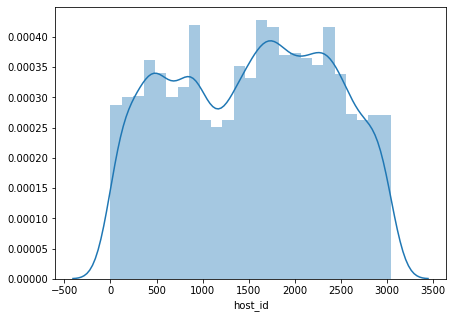

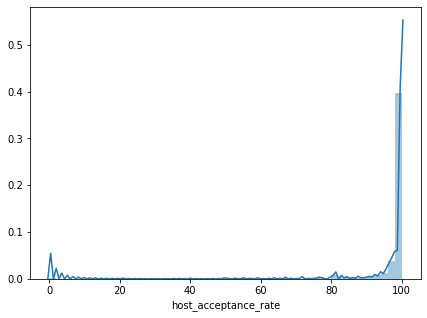

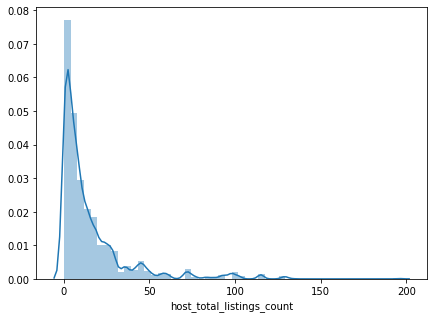

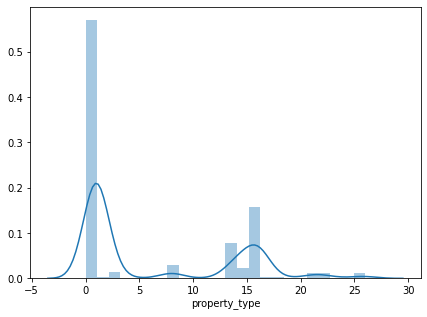

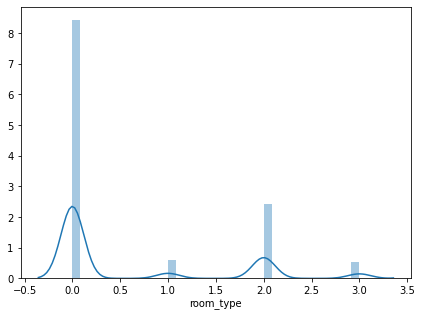

...

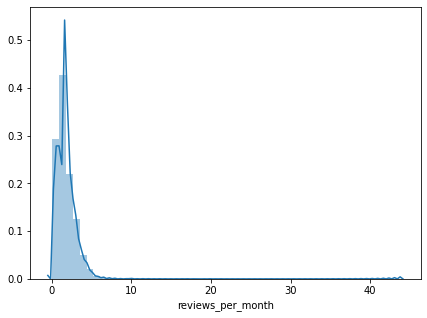

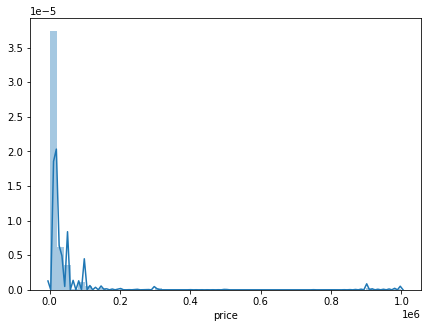

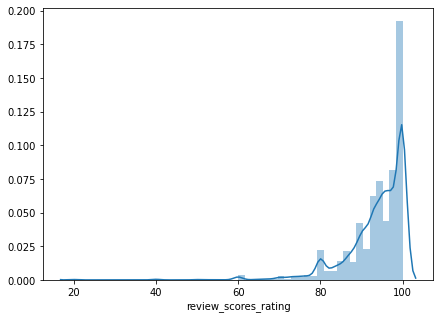

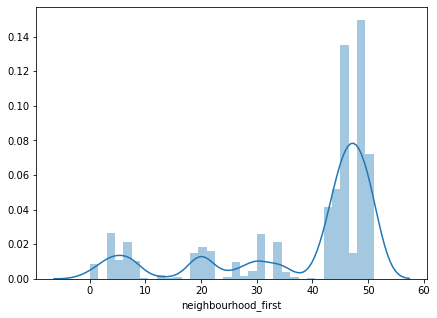

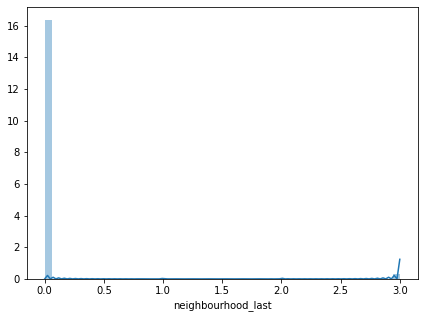

In [ ]:
for i in data_pick.columns:
  plt.figure(figsize=(7,5))
  sn.distplot(data_pick[i])

## Check Skewness

* If the skewness is between -0.5 and 0.5, the data are fairly symmetrical.
* If the skewness is between -1 and -0.5(negatively skewed) or between 0.5 and 1(positively skewed), the data are moderately skewed.
* If the skewness is less than -1(negatively skewed) or greater than 1(positively skewed), the data are highly skewed.





In [ ]:
for i in data_pick.columns:
  print("Skew score", i, data_pick[i].skew())

Skew score host_id -0.05126433428327936
Skew score host_acceptance_rate -5.928699551079947
Skew score host_total_listings_count 2.823133021669357
Skew score property_type 0.8354204985379683
Skew score room_type 1.203333716544662
Skew score accommodates 1.6509036582179053
Skew score bedrooms 14.024761448322687
Skew score extra_people 4.322253455201358
Skew score number_of_reviews 2.928523155481735
Skew score number_of_reviews_ltm 6.9972892114577165
Skew score reviews_per_month 5.349209998832784
Skew score price 9.436975131684072
Skew score review_scores_rating -2.571404797984426
Skew score neighbourhood_first -1.307191251226388
Skew score neighbourhood_last 7.185478785256463


Melihat dari statistik data yang ada, banyak kolom yang tidak seimbang oleh karena itu diperlukan transformasi, standarisasi, dan pembuangan outliers data

## Remove Outlier

dilakukan penghitungan z-score yang mana adalah nilai berapa kali standard deviasi data berada di atas atau di bawah rata-rata. Misalnya z-score 2, artinya data tersebut diatas nilai rata-rata sebesar 2 kali standard deviasi.

$Z_i = \frac{Y_i - \bar{Y}} {s}$

z-score yang lebih dari 3 dapat di katakan sebagai outliers dari data tersebut.

In [ ]:
print('Before:',len(data_pick))

z = np.abs(stats.zscore(data_pick))

threshold = 3

data_pick = data_pick[(z < threshold).all(axis=1)]
data_pick = data_pick.reset_index(drop = True)

print('After:',len(data_pick))

Before: 12711
After: 10735


## Data Transformation

pada tahap ini saya setelah mencoba transformasi **log, square, square_root,** dan **sigmoid** untuk setiap feature dan membandingkan perubahan nilai korelasi yang terjadi terhadap target. Dari hasil percobaan tersebut saya memutuskan untuk melakukan transformasi-transformasi berikut:


*   host_id -> **square**
*   host_total_listings_count -> **log** (klasifikasi) dan **square** (regression)
*   number_of_reviews -> **sigmoid**
*   number_of_reviews_ltm -> **sigmoid**

untuk kolom 'host_acceptance_rate' saya melakukana kategorisasi:
*   nilai 0-90 menjadi 0
*   nilai 91-100 menjadi 1




In [ ]:
def sigmoid(x):
    e = np.exp(1)
    y = 1/(1+e**(-x))
    return y

def square(x):
  return np.square(x)

def log(x):
  return np.log(x - x.min()+1)

### square transformation

In [ ]:
data_pick['host_id'] = square(data_pick['host_id'] )
data_pick['reg_host_total_listings_count'] = square(data_pick['host_total_listings_count'] )

### sigmoid transformation

In [ ]:
data_pick['number_of_reviews'] = sigmoid(data_pick['number_of_reviews'] )
data_pick['number_of_reviews_ltm'] = sigmoid(data_pick['number_of_reviews_ltm'] )
data_pick['reviews_per_month'] = sigmoid(data_pick['reviews_per_month'] )

### log transformation

In [ ]:
data_pick['class_host_total_listings_count'] = log(data_pick['host_total_listings_count'] )

### Categorization

In [ ]:
sz = len(data_pick)

print(sz)

tmp = []

for i in range(sz):
  if (data_pick['host_acceptance_rate'].loc[i] <91):
    tmp.append(0)
  else:
    tmp.append(1)
    
data_pick.drop(columns=["host_acceptance_rate"])
data_pick["host_acceptance_rate"] = tmp

10735


### Data Correlaration

In [ ]:
data_pick.describe().T

,count,mean,std,min,25%,50%,75%,max
host_id,10735.0,3.112655e+06,2.597177e+06,0.0,756900.000000,2.608225e+06,5.058001e+06,9.223369e+06
host_acceptance_rate,10735.0,9.361900e-01,2.444255e-01,0.0,1.000000,1.000000e+00,1.000000e+00,1.000000e+00
host_total_listings_count,10735.0,1.312399e+01,1.488212e+01,0.0,3.000000,8.000000e+00,1.900000e+01,7.700000e+01
property_type,10735.0,5.977550e+00,7.173809e+00,0.0,1.000000,1.000000e+00,1.400000e+01,2.600000e+01
room_type,10735.0,5.805310e-01,9.583331e-01,0.0,0.000000,0.000000e+00,1.000000e+00,3.000000e+00
accommodates,10735.0,4.172799e+00,2.559529e+00,1.0,2.000000,4.000000e+00,6.000000e+00,1.300000e+01
bedrooms,10735.0,1.242850e+00,8.237603e-01,0.0,1.000000,1.000000e+00,1.000000e+00,5.000000e+00
extra_people,10735.0,1.335458e+03,1.261697e+03,0.0,0.000000,1.500000e+03,2.000000e+03,6.000000e+03
number_of_reviews,10735.0,9.052610e-01,1.776854e-01,0.5,0.952574,9.999977e-01,1.000000e+00,1.000000e+00
number_of_reviews_ltm,10735.0,8.826234e-01,1.913944e-01,0.5,0.880797,9.996646e-01,1.000000e+00,1.000000e+00


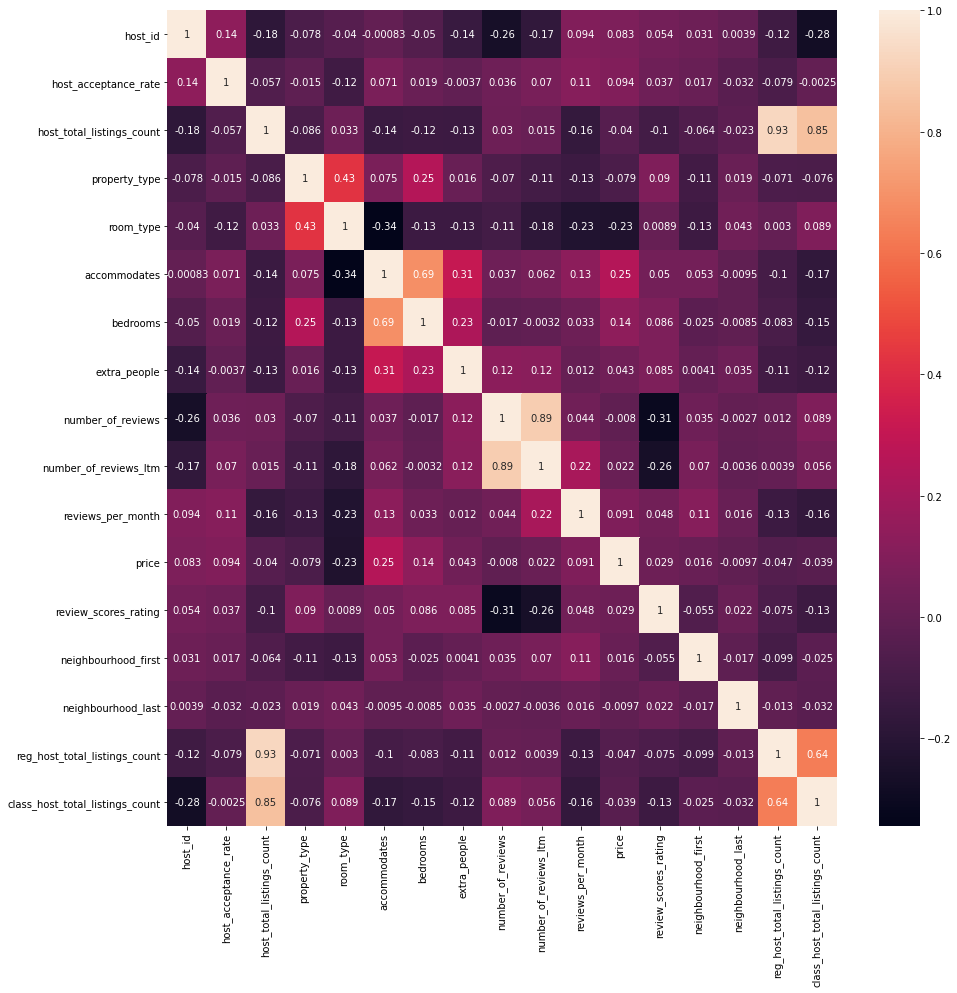

In [ ]:
df = DataFrame(data_pick)

corrMatrix = df.corr()
plt.figure(figsize=(15, 15)) 
sn.heatmap(corrMatrix, annot=True)

## One-hot Encoding

untuk kolom kategorial dengan nilai unik yang tidak terlalu banyak, saya melakukan one-hot encoding. Untuk kolom kategorial yang nilai uniknya banyak tidak dilakukan, karena akan menyebabkan ukuran data yang terlalu besar sehingga memperlambat komputasi dan tidak efisien.

One-hot encoding dilakukan karena pada dasarnya nilai kategorial yang ada seharusnya tidak memiliki rank/tingkatan. Misalnya untuk nama kota A, kota B dan kota C, saat di lakukan label encoding saja maka di hasilnya nilai 0,1,2. Nilai ini akan berpengaruh pada model yang menggunakan nilai tersbut sebagai perhitungannya. Akibatnya dengan label encoding saja, kota A dapat diartikan lebih kecil dari kota C, padahal seharusnya 0 dan 2 tidak mau menunjukan hal tersebut. 

Dipilih kolom berikut untuk di one-hot encoding:
*   'neighbourhood_last'
*   'room_type'



### check value of column with Object data type

In [ ]:
print(data_pick['neighbourhood_last'].value_counts())
print(data_pick['room_type'].value_counts())

0    10726
1        9
Name: neighbourhood_last, dtype: int64
0    7633
2    2146
3     492
1     464
Name: room_type, dtype: int64


In [ ]:
print(data_pick['neighbourhood_first'].value_counts())
print(data_pick['property_type'].value_counts())

46    2043
49    1382
51    1212
48     950
44     877
42     407
30     400
34     353
7      340
43     307
3      292
20     288
21     272
47     259
19     253
45     189
5      168
26     163
8      161
0      143
4      136
29      66
35      65
39       5
11       3
41       1
Name: neighbourhood_first, dtype: int64
1     6711
16    1653
14     815
8      367
15     263
3      170
22     153
21     143
0      138
26      96
17      44
18      42
13      41
2       30
25      24
24      13
12      12
4        5
10       4
20       3
5        3
9        1
11       1
6        1
7        1
23       1
Name: property_type, dtype: int64


In [ ]:
one_hot = pd.get_dummies(data_pick.neighbourhood_last, prefix='neighbourhood_last')
data_pick = data_pick.drop('neighbourhood_last',axis = 1)
data_pick = pd.concat([data_pick,one_hot], axis = 1)

one_hot = pd.get_dummies(data_pick.room_type, prefix='room_type')
data_pick = data_pick.drop('room_type',axis = 1)
data_pick = pd.concat([data_pick,one_hot], axis = 1)

In [ ]:
data_pick_copy = data_pick.copy()

#Split into Test and Train

data yang ada di bagi menjadi train set dan test set:
*   **Train (80%):** 8588
*   **Test (20%):** 2147



In [ ]:
X = data_pick.drop(columns=pick_targets)
Y = data_pick[pick_targets]

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2)

In [ ]:
x_train = x_train.reset_index(drop = True)
x_test = x_test.reset_index(drop = True)

y_train = y_train.reset_index(drop = True)
y_test = y_test.reset_index(drop = True)

In [ ]:
from google.colab import files
x_train.to_csv('train.csv') 
x_test.to_csv('test.csv')

Split Raw Data (data yang tidak di features engineering dan features selection)

In [ ]:
Xx = data_pick_raw.drop(columns=pick_targets)
Yy = data_pick_raw[pick_targets]

In [ ]:
xx_train, xx_test, yy_train, yy_test = train_test_split(Xx, Yy, test_size=0.2)

In [ ]:
xx_train = xx_train.reset_index(drop = True)
xx_test = xx_test.reset_index(drop = True)

yy_train = yy_train.reset_index(drop = True)
yy_test = yy_test.reset_index(drop = True)

# Data Scaling

karena range nilai yang berbeda-beda untuk setiap kolom, maka perlu adanya scaling data

In [ ]:
x_train.describe().T

,count,mean,std,min,25%,50%,75%,max
host_id,8588.0,3.118971e+06,2.594501e+06,0.0,756900.000000,2.621161e+06,5.058001e+06,9.217296e+06
host_acceptance_rate,8588.0,9.349092e-01,2.467004e-01,0.0,1.000000,1.000000e+00,1.000000e+00,1.000000e+00
host_total_listings_count,8588.0,1.314974e+01,1.492103e+01,0.0,3.000000,8.000000e+00,1.900000e+01,7.700000e+01
property_type,8588.0,6.024802e+00,7.197037e+00,0.0,1.000000,1.000000e+00,1.400000e+01,2.600000e+01
accommodates,8588.0,4.153703e+00,2.533693e+00,1.0,2.000000,4.000000e+00,6.000000e+00,1.300000e+01
bedrooms,8588.0,1.237890e+00,8.179447e-01,0.0,1.000000,1.000000e+00,1.000000e+00,5.000000e+00
extra_people,8588.0,1.329852e+03,1.265093e+03,0.0,0.000000,1.500000e+03,2.000000e+03,6.000000e+03
number_of_reviews,8588.0,9.055049e-01,1.774523e-01,0.5,0.952574,9.999977e-01,1.000000e+00,1.000000e+00
number_of_reviews_ltm,8588.0,8.821313e-01,1.916867e-01,0.5,0.880797,9.996646e-01,1.000000e+00,1.000000e+00
reviews_per_month,8588.0,7.997716e-01,1.312135e-01,0.5,0.702661,8.486971e-01,9.011439e-01,9.959299e-01


digunakan StandardScaler yang mana men-scaling data dengan formula:

$z = \frac{x-u} {s}$

dimana x adalah data, u adalah rata-rata, dan s adalah standard deviasi


In [ ]:
prepro = preprocessing.StandardScaler()

scaled = prepro.fit_transform(x_train)
x_train = pd.DataFrame(scaled, index=x_train.index, columns=x_train.columns)

scaled = prepro.fit_transform(x_test)
x_test = pd.DataFrame(scaled, index=x_test.index, columns=x_test.columns)

In [ ]:
x_train.describe().T

,count,mean,std,min,25%,50%,75%,max
host_id,8588.0,-1.288883e-16,1.000058,-1.202217,-0.910467,-0.191882,0.747405,2.350618
host_acceptance_rate,8588.0,-6.291867e-17,1.000058,-3.789874,0.263861,0.263861,0.263861,0.263861
host_total_listings_count,8588.0,1.783493e-16,1.000058,-0.881341,-0.680270,-0.345153,0.392104,4.279461
property_type,8588.0,-3.596719e-16,1.000058,-0.837171,-0.698217,-0.698217,1.108187,2.775637
accommodates,8588.0,2.198340e-17,1.000058,-1.244778,-0.850075,-0.060667,0.728740,3.491667
bedrooms,8588.0,3.117622e-16,1.000058,-1.513504,-0.290856,-0.290856,-0.290856,4.599735
extra_people,8588.0,-8.718379e-17,1.000058,-1.051250,-1.051250,0.134502,0.529753,3.691759
number_of_reviews,8588.0,-1.481892e-16,1.000058,-2.285281,0.265266,0.532528,0.532541,0.532541
number_of_reviews_ltm,8588.0,-5.590932e-16,1.000058,-1.993636,-0.006961,0.613189,0.614938,0.614938
reviews_per_month,8588.0,-5.561457e-17,1.000058,-2.284742,-0.740141,0.372891,0.772621,1.495042


# Regression

# Linear Regression

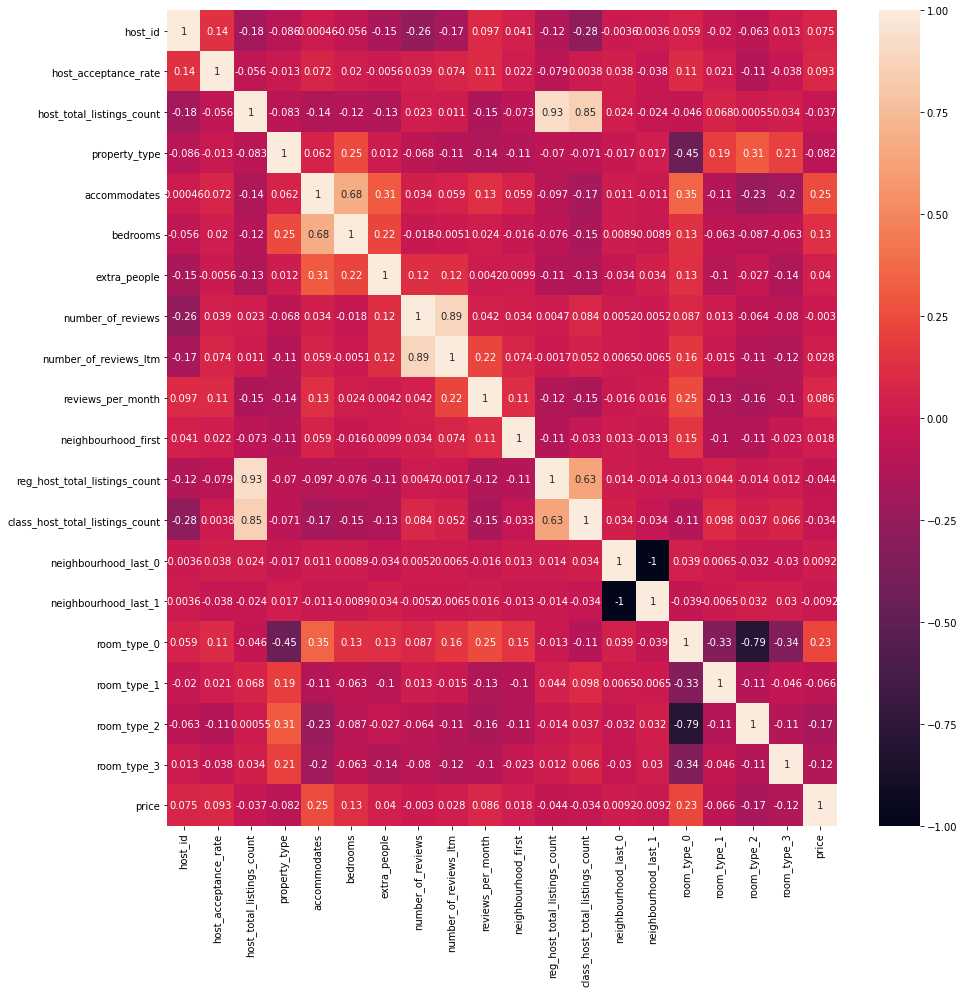

In [ ]:
tmp = pd.concat([x_train, y_train['price']],axis = 1)

df = DataFrame(tmp)

corrMatrix = df.corr()
plt.figure(figsize=(15, 15)) 
sn.heatmap(corrMatrix, annot=True)

## Features Selection :: RFE
pemilihan features dengan RFE

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split

model = LinearRegression()

maxi = 0
n_features = 0

for n in range(1,x_train.shape[1]):
  rfe = RFE(model, n)
  x_train_tmp = x_train
  x_test_tmp = x_test
  y_train_tmp = y_train['price']
  y_test_tmp = y_test['price']

  x_train_rfe = rfe.fit_transform(x_train_tmp,np.ravel(y_train_tmp))
  x_test_rfe = rfe.transform(x_test_tmp)

  model.fit(x_train_rfe, y_train_tmp)
  score = model.score(x_test_rfe, y_test_tmp)
  if score > maxi:
    maxi = score
    n_features = n
    tmp = rfe.support_

print("Optimum number of features: ", n_features)
print("with R2 score: ", maxi)

selected_features_rfe = []

for id,i in enumerate(tmp):
  if i == True:
    print("selected       ::",x_train_tmp.columns[id],)
    selected_features_rfe.append(x_train_tmp.columns[id])
  else:
    print("not selected   ::", x_train_tmp.columns[id])

Optimum number of features:  11
with R2 score:  0.1036473653555754
selected       :: host_id
selected       :: host_acceptance_rate
selected       :: host_total_listings_count
not selected   :: property_type
selected       :: accommodates
not selected   :: bedrooms
selected       :: extra_people
selected       :: number_of_reviews
not selected   :: number_of_reviews_ltm
not selected   :: reviews_per_month
not selected   :: neighbourhood_first
selected       :: reg_host_total_listings_count
not selected   :: class_host_total_listings_count
not selected   :: neighbourhood_last_0
not selected   :: neighbourhood_last_1
selected       :: room_type_0
selected       :: room_type_1
selected       :: room_type_2
selected       :: room_type_3


In [ ]:
selected_features_rfe

['host_id',
 'host_acceptance_rate',
 'host_total_listings_count',
 'accommodates',
 'extra_people',
 'number_of_reviews',
 'reg_host_total_listings_count',
 'room_type_0',
 'room_type_1',
 'room_type_2',
 'room_type_3']

In [ ]:
XTrain = x_train[selected_features_rfe].copy()
YTrain = y_train['price'].copy()

XTest = x_test[selected_features_rfe].copy()
YTest = y_test['price'].copy()

In [ ]:
regression = LinearRegression()
regression.fit(XTrain, YTrain)
print('Coefficients: ', regression.coef_)
print('Intercept: ',regression.intercept_)

prediction = regression.predict(XTest)

print("MAE : ", metrics.mean_absolute_error(YTest, prediction))
print("MSE : ", metrics.mean_squared_error(YTest, prediction))
print("R2 : ", metrics.r2_score(YTest, prediction))

Coefficients:  [ 1454.40122872  1165.02366414  3765.18006668  4865.43039281
  -798.38651982  -254.94993522 -3815.75054217  2151.47061951
  -660.82735366 -1294.53395755 -1551.40516126]
Intercept:  18562.88635305077
MAE :  11896.517688256386
MSE :  437965212.0022857
R2 :  0.1036473653555754


## Features Selection :: Correlation Based
Pemilihan Features berdasarkan 5 features dengan korelasi tertinggi terhadap target

In [ ]:
selected_feature = [
                    # 'host_id',
                    # 'host_acceptance_rate',
                    # 'host_total_listings_count',
                    # 'property_type',
                    'accommodates',
                    'bedrooms',
                    # 'extra_people',
                    # 'number_of_reviews',
                    # 'number_of_reviews_ltm',
                    # 'reviews_per_month',
                    # 'neighbourhood_first',
                    # 'neighbourhood_last_0',
                    # 'neighbourhood_last_1',
                    'room_type_0',
                    # 'room_type_1',
                    'room_type_2',
                    'room_type_3',
                    # 'reg_host_total_listings_count',
                    # 'class_host_total_listings_count'
                    ]

In [ ]:
XTrain = x_train[selected_feature].copy()
YTrain = y_train['price'].copy()

XTest = x_test[selected_feature].copy()
YTest = y_test['price'].copy()

In [ ]:
regression = LinearRegression()
regression.fit(XTrain, YTrain)
print('Coefficients: ', regression.coef_)
print('Intercept: ',regression.intercept_)

prediction = regression.predict(XTest)

print("MAE : ", metrics.mean_absolute_error(YTest, prediction))
print("MSE : ", metrics.mean_squared_error(YTest, prediction))
print("R2 : ", metrics.r2_score(YTest, prediction))

Coefficients:  [5208.22993896 -931.57420632 3318.73424711 -353.52636717 -826.80851141]
Intercept:  18562.88635305077
MAE :  11981.851260033509
MSE :  446270789.9824605
R2 :  0.08664892232687305


## Raw Data Comparison

In [ ]:
regression = LinearRegression()
regression.fit(xx_train, yy_train['price'])
print('Coefficients: ', regression.coef_)
print('Intercept: ',regression.intercept_)

prediction = regression.predict(xx_test)

print("MAE : ", metrics.mean_absolute_error(yy_test['price'], prediction))
print("MSE : ", metrics.mean_squared_error(yy_test['price'], prediction))
print("R2 : ", metrics.r2_score(yy_test['price'], prediction))

Coefficients:  [-9.48742678e-06  3.32346664e+02  7.01062618e+02 -7.09193718e+01
  1.49118038e+02 -5.06374469e+03  3.22478617e+03 -4.48971686e+02
  3.45506965e+00 -9.17958666e+01  1.36872060e+02  1.93132712e+03]
Intercept:  -33583.52837306679
MAE :  23360.17902745063
MSE :  5243334615.367598
R2 :  0.07729885844122286


## Conclusion


*   Features Engineering dan Features Selection memberikan hasil yang lebih baik dari pada langsung menggunakan data yang tanpa proses melalui tersebut.
*   Metrik yang digunakan untuk mengukur peforma adalah:
    *   Mean Absolute Error
    *   Mean Squared Error
    *   R^2
* Hasil evaluasi metrik menunjukan:
    *   Secara keseluruhan nilai MAE, MSE, dan R^2 dari data yang telah di Feature Engineering lebih baik dari pada yang tidak
    *   Features Selection dengan RFE memberikan hasil yang lebih baik dari pada Feature Selection berdasarkan 5 feature dengan nilai absolut korelasi tertinggi

# Classification

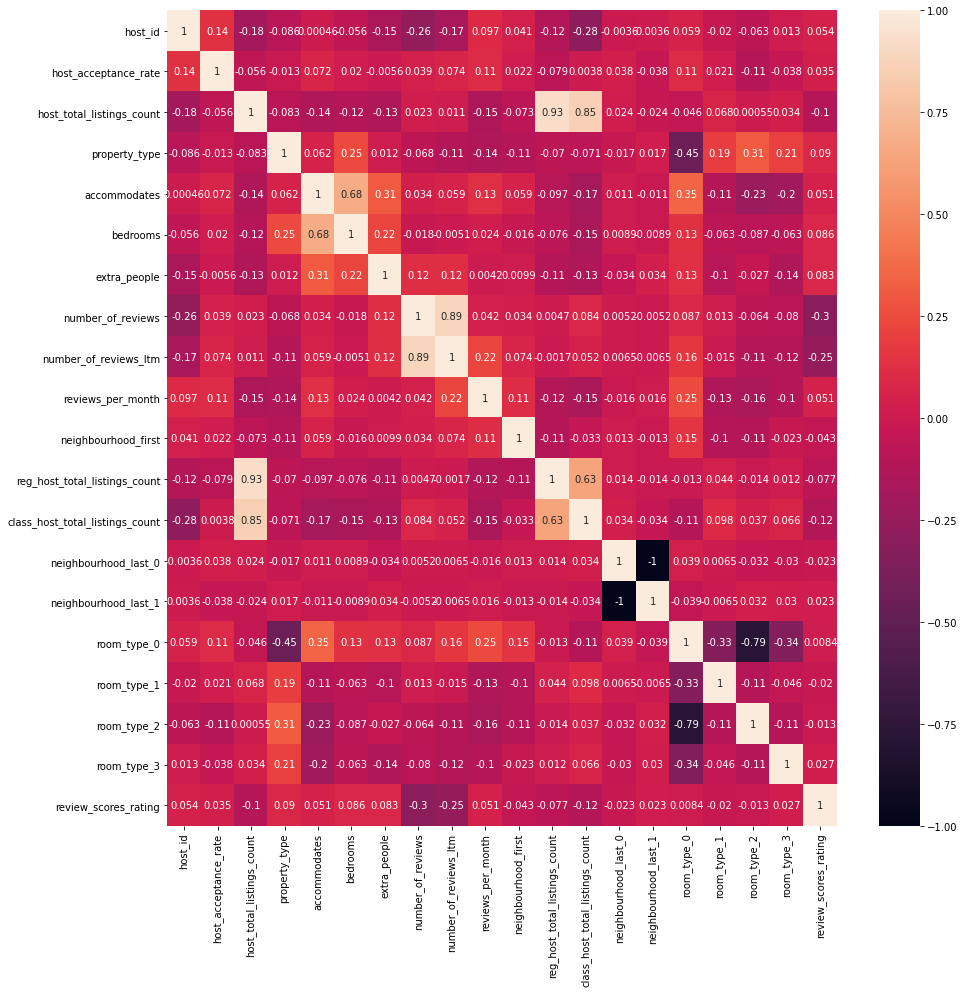

In [ ]:
tmp = pd.concat([x_train, y_train['review_scores_rating']],axis = 1)

df = DataFrame(tmp)

corrMatrix = df.corr()
plt.figure(figsize=(15, 15)) 
sn.heatmap(corrMatrix, annot=True)

memilih 5 features dengan korelasi tertinggi terhadap target

In [ ]:
selected_feature_corr = [
                    # 'host_id',
                    # 'host_acceptance_rate',
                    # 'host_total_listings_count',
                    # 'property_type',
                    # 'accommodates',
                    'bedrooms',
                    'extra_people',
                    'number_of_reviews',
                    'number_of_reviews_ltm',
                    # 'reviews_per_month',
                    # 'neighbourhood_first',
                    # 'neighbourhood_last_0',
                    # 'neighbourhood_last_1',
                    # 'room_type_0',
                    # 'room_type_1',
                    # 'room_type_2',
                    # 'room_type_3',
                    # 'reg_host_total_listings_count',
                    'class_host_total_listings_count'
                    ]

# KNN

## Feature Selection :: Correlation Base

In [ ]:
XTrain = x_train[selected_feature_corr].copy()
YTrain = y_train['review_scores_rating'].copy()
XTest = x_test[selected_feature_corr].copy()
YTest = y_test['review_scores_rating'].copy()

pemilihan K dengan percobaan K dari 1 sampai 50

Text(0, 0.5, 'Error Rate')

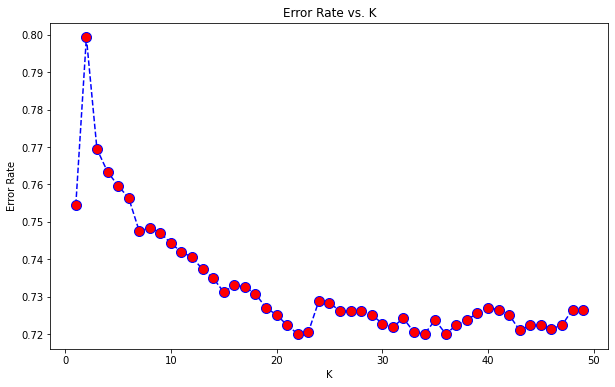

In [ ]:
error_rate = []

for i in range(1,50):
  KNN = KNeighborsClassifier(n_neighbors=i)
  KNN.fit(XTrain, YTrain)
  prediction = KNN.predict(XTest)
  error_rate.append(np.mean(prediction != YTest))

plt.figure(figsize=(10,6))
plt.plot(range(1,50),error_rate,color='blue', linestyle='dashed', marker='o', markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K')
plt.xlabel('K')
plt.ylabel('Error Rate')

In [ ]:
KNN = KNeighborsClassifier(n_neighbors=22)
KNN.fit(XTrain, YTrain)

pred_train = KNN.predict(XTrain)
prediction = KNN.predict(XTest)

print("Train set acc: ", metrics.accuracy_score(YTrain, pred_train))
print("Train set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(YTrain, pred_train, average='weighted'))
print("Test set acc: ", metrics.accuracy_score(YTest, prediction))
print("Test set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(YTest, prediction, average='weighted'))

Train set acc:  0.34385188635305075
Train set precision, recall, F-measure:  (0.30593811727490267, 0.34385188635305075, 0.3151483526331938, None)
Test set acc:  0.27992547741034
Test set precision, recall, F-measure:  (0.2331727866667688, 0.27992547741034, 0.25102242928355495, None)


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Text(0.5, 69.0, 'Predicted label')

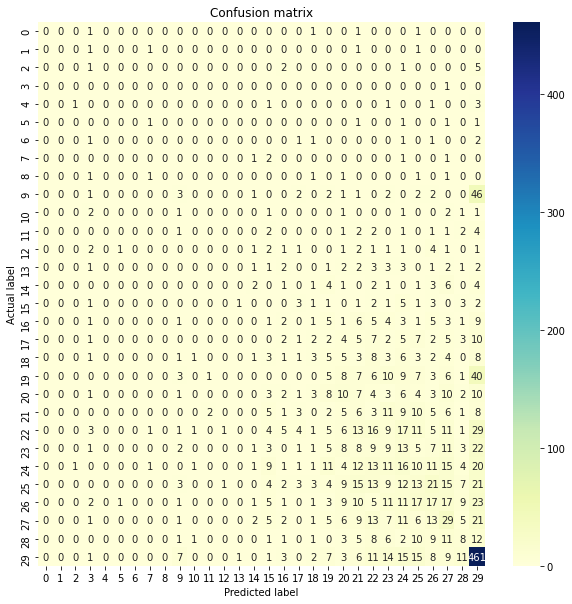

In [ ]:
cnf_matrix = metrics.confusion_matrix(YTest, prediction)

plt.figure(figsize=(10, 10)) 
p = sn.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')

plt.title('Confusion matrix')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

## Features Selection :: K-Best f_classif()

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

acc = 0

for i in range(1,x_train.shape[1]):
  fs = SelectKBest(score_func=f_classif, k=i)
  fs.fit(X, Y['review_scores_rating'])

  XTrain = fs.transform(x_train)
  YTrain = y_train['review_scores_rating'].copy()
  XTest = fs.transform(x_test)
  YTest = y_test['review_scores_rating'].copy()

  KNN = KNeighborsClassifier(n_neighbors=22)
  KNN.fit(XTrain, YTrain)

  pred_train = KNN.predict(XTrain)
  prediction = KNN.predict(XTest)

  acc_now= metrics.accuracy_score(YTest, prediction)

  if acc_now>acc :
    acc = acc_now
    kbest = i 
    tmp = fs.get_support()

print(kbest, 'with accuracy', acc)

selected_features_kbest = []

for id,i in enumerate(tmp):
  if i == True:
    print("selected       ::",x_train.columns[id],)
    selected_features_kbest.append(x_train.columns[id])
  else:
    print("not selected   ::", x_train.columns[id])

10 with accuracy 0.28924080111783884
selected       :: host_id
not selected   :: host_acceptance_rate
selected       :: host_total_listings_count
selected       :: property_type
not selected   :: accommodates
not selected   :: bedrooms
selected       :: extra_people
selected       :: number_of_reviews
selected       :: number_of_reviews_ltm
selected       :: reviews_per_month
not selected   :: neighbourhood_first
selected       :: reg_host_total_listings_count
selected       :: class_host_total_listings_count
not selected   :: neighbourhood_last_0
not selected   :: neighbourhood_last_1
selected       :: room_type_0
not selected   :: room_type_1
not selected   :: room_type_2
not selected   :: room_type_3


In [ ]:
XTrain = x_train[selected_features_kbest].copy()
YTrain = y_train['review_scores_rating'].copy()
XTest = x_test[selected_features_kbest].copy()
YTest = y_test['review_scores_rating'].copy()

In [ ]:
KNN = KNeighborsClassifier(n_neighbors=22)
KNN.fit(XTrain, YTrain)

pred_train = KNN.predict(XTrain)
prediction = KNN.predict(XTest)

print("Train set acc: ", metrics.accuracy_score(YTrain, pred_train))
print("Train set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(YTrain, pred_train, average='weighted'))
print("Test set acc: ", metrics.accuracy_score(YTest, prediction))
print("Test set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(YTest, prediction, average='weighted'))

Train set acc:  0.3593386120167676
Train set precision, recall, F-measure:  (0.3071070232522876, 0.3593386120167676, 0.32290613073256424, None)
Test set acc:  0.28924080111783884
Test set precision, recall, F-measure:  (0.2302786641139473, 0.28924080111783884, 0.25165839716680066, None)


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Text(0.5, 69.0, 'Predicted label')

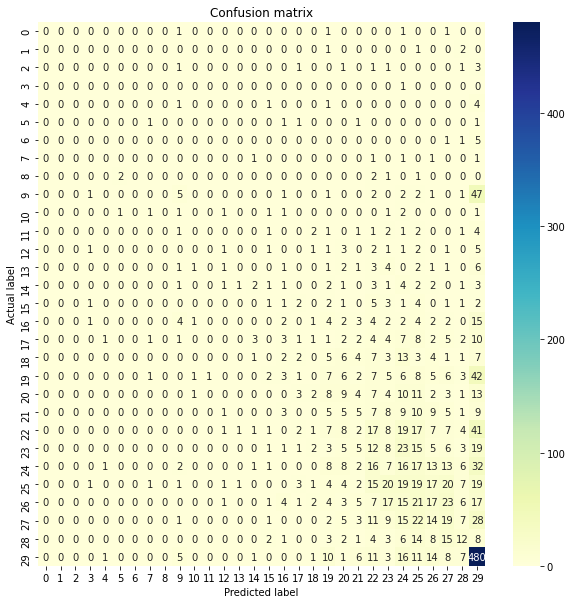

In [ ]:
cnf_matrix = metrics.confusion_matrix(YTest, prediction)

plt.figure(figsize=(10, 10)) 
p = sn.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')

plt.title('Confusion matrix')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

## Raw Data Comparison

In [ ]:
KNN = KNeighborsClassifier(n_neighbors=22)
KNN.fit(xx_train, yy_train['review_scores_rating'])

pred_train = KNN.predict(xx_train)
prediction = KNN.predict(xx_test)

print("Train set acc: ", metrics.accuracy_score(yy_train['review_scores_rating'], pred_train))
print("Train set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(yy_train['review_scores_rating'], pred_train, average='weighted'))
print("Test set acc: ", metrics.accuracy_score(yy_test['review_scores_rating'], prediction))
print("Test set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(yy_test['review_scores_rating'], prediction, average='weighted'))

Train set acc:  0.24248851184164016
Train set precision, recall, F-measure:  (0.21117555858996673, 0.24248851184164016, 0.21188001262007, None)
Test set acc:  0.15598491988689916
Test set precision, recall, F-measure:  (0.11975975972156615, 0.15598491988689916, 0.1242758676741734, None)


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Resample Comparison

In [ ]:
sm = SMOTE()
x_train_tmp, y_train_tmp = sm.fit_sample(x_train, y_train['review_scores_rating'])

In [ ]:
KNN = KNeighborsClassifier(n_neighbors=22)
KNN.fit(x_train_tmp, y_train_tmp)

pred_train = KNN.predict(x_train_tmp)
prediction = KNN.predict(x_test)

print("Train set acc: ", metrics.accuracy_score(y_train_tmp, pred_train))
print("Train set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(y_train_tmp, pred_train, average='weighted'))
print("Test set acc: ", metrics.accuracy_score(y_test['review_scores_rating'], prediction))
print("Test set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(y_test['review_scores_rating'], prediction, average='weighted'))

Train set acc:  0.7119496855345911
Train set precision, recall, F-measure:  (0.7042582927377085, 0.7119496855345911, 0.699088673689645, None)
Test set acc:  0.1737307871448533
Test set precision, recall, F-measure:  (0.31846016044199676, 0.1737307871448533, 0.2100424110991274, None)


## Conclusion

*   Features Engineering dan Features Selection memberikan hasil yang lebih baik dari pada langsung menggunakan data yang tanpa proses melalui tersebut.
*   Metrik yang digunakan untuk mengukur peforma adalah:
    *   Accuracy score
    *   Precision
    *   Recall
    *   F-1
    *   Confussion Matrix
* Hasil evaluasi metrik menunjukan:
    *   Secara keseluruhan nilai accuracy test set dari data yang telah di Feature Engineering lebih baik dari pada yang tidak
    *   Features Selection dengan K-Best f_classif() memberikan hasil yang lebih baik dari pada Feature Selection berdasarkan 5 feature dengan nilai absolut korelasi tertinggi
    * Karena adanya kelas yang kurang seimbang, dicoba SMOTE pada train set dan hasilnya menunjukan model overfitting (dilihat dari nilai metrik yang sangat jauh berbeda antara test set dan train set)
    * Model menunjukan peforma yang cukup seimbang pada test set dan train set (selain saat SMOTE digunakan)
* K yang terpilih dari Features Selection berdasarkan korelasi, yakni 22, digunakan untuk menjadi nilai K pada seluruh model
* Model KNN memperoleh nilai F1 dan precision tertinggi pada test set dibandingkan dengan model KNN dan Tree based

# SVM

## Feature Selection :: Correlation Base

In [ ]:
XTrain = x_train[selected_feature_corr].copy()
YTrain = y_train['review_scores_rating'].copy()
XTest = x_test[selected_feature_corr].copy()
YTest = y_test['review_scores_rating'].copy()

In [ ]:
SVM = svm.SVC(decision_function_shape='ovo')
# SVM = svm.LinearSVC()
SVM.fit(XTrain, YTrain)

pred_train = SVM.predict(XTrain)
prediction = SVM.predict(XTest)


print("Train set acc: ", metrics.accuracy_score(YTrain, pred_train))
print("Train set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(YTrain, pred_train, average='weighted'))
print("Test set acc: ", metrics.accuracy_score(YTest, prediction))
print("Test set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(YTest, prediction, average='weighted'))

Train set acc:  0.28795994410805775
Train set precision, recall, F-measure:  (0.1834228881816442, 0.28795994410805775, 0.21519354485941444, None)
Test set acc:  0.2775966464834653
Test set precision, recall, F-measure:  (0.17990981517859447, 0.2775966464834653, 0.2121026790005195, None)


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Text(0.5, 69.0, 'Predicted label')

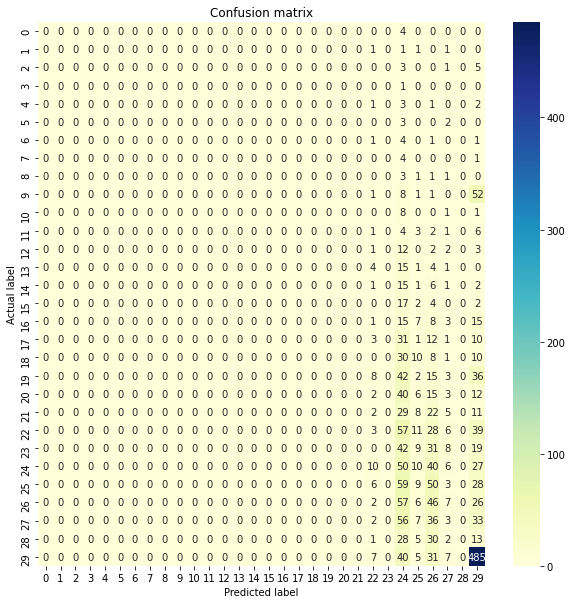

In [ ]:
cnf_matrix = metrics.confusion_matrix(YTest, prediction)

plt.figure(figsize=(10, 10)) 
p = sn.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')

plt.title('Confusion matrix')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')


## Features Selection :: K-Best f_classif()

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

acc = 0

for i in range(1,x_train.shape[1]):
  fs = SelectKBest(score_func=f_classif, k=i)
  fs.fit(X, Y['review_scores_rating'])

  XTrain = fs.transform(x_train)
  YTrain = y_train['review_scores_rating'].copy()
  XTest = fs.transform(x_test)
  YTest = y_test['review_scores_rating'].copy()

  SVM = svm.SVC(decision_function_shape='ovo')
  SVM.fit(XTrain, YTrain)

  pred_train = SVM.predict(XTrain)
  prediction = SVM.predict(XTest)

  acc_now= metrics.accuracy_score(YTest, prediction)

  if acc_now>acc :
    acc = acc_now
    kbest = i 
    tmp = fs.get_support()

print(kbest, 'with accuracy', acc)

selected_features_kbest = []

for id,i in enumerate(tmp):
  if i == True:
    print("selected       ::",x_train.columns[id],)
    selected_features_kbest.append(x_train.columns[id])
  else:
    print("not selected   ::", x_train.columns[id])

4 with accuracy 0.3008849557522124
selected       :: host_id
not selected   :: host_acceptance_rate
not selected   :: host_total_listings_count
not selected   :: property_type
not selected   :: accommodates
not selected   :: bedrooms
not selected   :: extra_people
selected       :: number_of_reviews
selected       :: number_of_reviews_ltm
selected       :: reviews_per_month
not selected   :: neighbourhood_first
not selected   :: reg_host_total_listings_count
not selected   :: class_host_total_listings_count
not selected   :: neighbourhood_last_0
not selected   :: neighbourhood_last_1
not selected   :: room_type_0
not selected   :: room_type_1
not selected   :: room_type_2
not selected   :: room_type_3


In [ ]:
XTrain = x_train[selected_features_kbest].copy()
YTrain = y_train['review_scores_rating'].copy()
XTest = x_test[selected_features_kbest].copy()
YTest = y_test['review_scores_rating'].copy()

In [ ]:
SVM = svm.SVC(decision_function_shape='ovo')
# SVM = svm.LinearSVC()
SVM.fit(XTrain, YTrain)

pred_train = SVM.predict(XTrain)
prediction = SVM.predict(XTest)


print("Train set acc: ", metrics.accuracy_score(YTrain, pred_train))
print("Train set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(YTrain, pred_train, average='weighted'))
print("Test set acc: ", metrics.accuracy_score(YTest, prediction))
print("Test set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(YTest, prediction, average='weighted'))

Train set acc:  0.2934326967862133
Train set precision, recall, F-measure:  (0.19341006381469603, 0.2934326967862133, 0.19541356874179866, None)
Test set acc:  0.3008849557522124
Test set precision, recall, F-measure:  (0.15083800067802486, 0.3008849557522124, 0.19900916431613613, None)


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Text(0.5, 69.0, 'Predicted label')

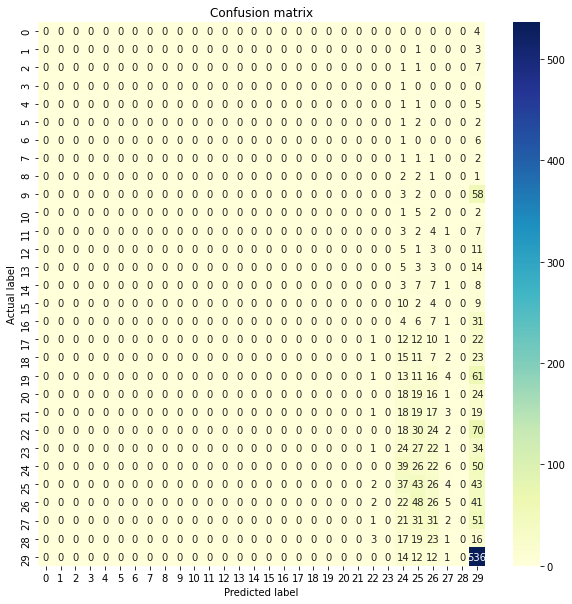

In [ ]:
cnf_matrix = metrics.confusion_matrix(YTest, prediction)

plt.figure(figsize=(10, 10)) 
p = sn.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')

plt.title('Confusion matrix')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

## Raw Data Comparison

In [ ]:
SVM = svm.SVC(decision_function_shape='ovo')
SVM.fit(xx_train, yy_train['review_scores_rating'])

pred_train = SVM.predict(xx_train)
prediction = SVM.predict(xx_test)

print("Train set acc: ", metrics.accuracy_score(yy_train['review_scores_rating'], pred_train))
print("Train set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(yy_train['review_scores_rating'], pred_train, average='weighted'))
print("Test set acc: ", metrics.accuracy_score(yy_test['review_scores_rating'], prediction))
print("Test set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(yy_test['review_scores_rating'], prediction, average='weighted'))

Train set acc:  0.1737952162130317
Train set precision, recall, F-measure:  (0.03020477717853444, 0.1737952162130317, 0.051465156377077256, None)
Test set acc:  0.1583411875589067
Test set precision, recall, F-measure:  (0.025071931677564867, 0.1583411875589067, 0.04328937267680443, None)


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Resample Comparison

In [ ]:
sm = SMOTE()
x_train_tmp, y_train_tmp = sm.fit_sample(x_train, y_train['review_scores_rating'])

In [ ]:
SVM = svm.SVC(decision_function_shape='ovo')
SVM.fit(x_train_tmp, y_train_tmp)

pred_train = SVM.predict(x_train_tmp)
prediction = SVM.predict(x_test)

print("Train set acc: ", metrics.accuracy_score(y_train_tmp, pred_train))
print("Train set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(y_train_tmp, pred_train, average='weighted'))
print("Test set acc: ", metrics.accuracy_score(y_test['review_scores_rating'], prediction))
print("Test set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(y_test['review_scores_rating'], prediction, average='weighted'))

Train set acc:  0.5345326897762176
Train set precision, recall, F-measure:  (0.5246735397966721, 0.5345326897762176, 0.5135065240513639, None)
Test set acc:  0.22030740568234747
Test set precision, recall, F-measure:  (0.30239142226563687, 0.22030740568234747, 0.24525066935186568, None)


## Conclusion

*   Features Engineering dan Features Selection memberikan hasil yang lebih baik dari pada langsung menggunakan data yang tanpa proses melalui tersebut.
*   Metrik yang digunakan untuk mengukur peforma adalah:
    *   Accuracy score
    *   Precision
    *   Recall
    *   F-1
    *   Confussion Matrix
* Hasil evaluasi metrik menunjukan:
    *   Secara keseluruhan nilai accuracy dari data yang telah di Feature Engineering lebih baik dari pada yang tidak
    *   Features Selection dengan K-Best f_classif() memberikan hasil yang lebih baik dari pada Feature Selection berdasarkan 5 feature dengan nilai absolut korelasi tertinggi
    * Karena adanya kelas yang kurang seimbang, dicoba SMOTE pada train set dan hasilnya menunjukan model overfitting (dilihat dari nilai metrik yang sangat jauh berbeda antara test set dan train set)
    * Model menunjukan peforma yang cukup seimbang pada test set dan train set (selain saat SMOTE digunakan)
    * Parameter decision_function_shape yang digunakan adalah 'ovo' (One Versus One), yang mana model akan melakukan klasifikasi dengan memasangkan kombinasi pasangan 2 kelas.
    * Model SVM memperoleh nilai accuracy dan recall tertinggi pada test set dibanding model KNN dan Tree based Classification

# Tree Based Classification

## Feature Selection :: Correlation Base

In [ ]:
XTrain = x_train[selected_feature_corr].copy()
YTrain = y_train['review_scores_rating'].copy()
XTest = x_test[selected_feature_corr].copy()
YTest = y_test['review_scores_rating'].copy()

In [ ]:
DT = RandomForestClassifier(max_depth=4, n_estimators=200)
DT.fit(XTrain, YTrain)

pred_train = DT.predict(XTrain)
prediction = DT.predict(XTest)


print("Train set acc: ", metrics.accuracy_score(YTrain, pred_train))
print("Train set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(YTrain, pred_train, average='weighted'))
print("Test set acc: ", metrics.accuracy_score(YTest, prediction))
print("Test set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(YTest, prediction, average='weighted'))

Train set acc:  0.3117140195621798
Train set precision, recall, F-measure:  (0.18510001371246687, 0.3117140195621798, 0.21038422576040272, None)
Test set acc:  0.29809035863996275
Test set precision, recall, F-measure:  (0.17601368973466208, 0.29809035863996275, 0.2094896230455193, None)


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Text(0.5, 69.0, 'Predicted label')

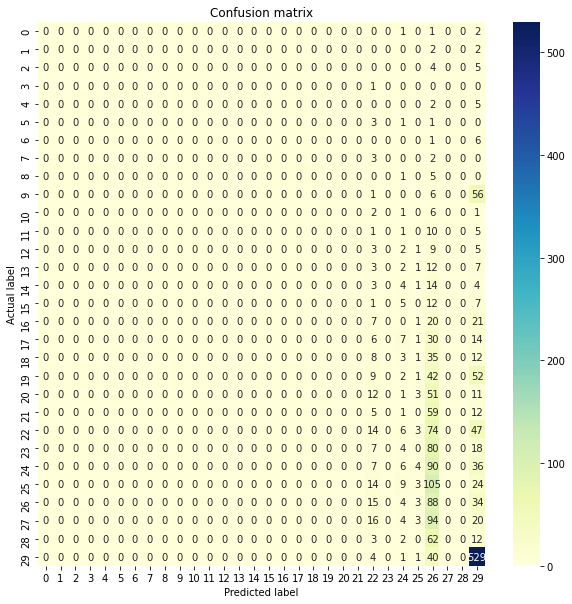

In [ ]:
cnf_matrix = metrics.confusion_matrix(YTest, prediction)

plt.figure(figsize=(10, 10)) 
p = sn.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')

plt.title('Confusion matrix')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')


## Features Selection :: K-Best f_classif()

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

acc = 0

for i in range(1,x_train.shape[1]):
  fs = SelectKBest(score_func=f_classif, k=i)
  fs.fit(X, Y['review_scores_rating'])

  XTrain = fs.transform(x_train)
  YTrain = y_train['review_scores_rating'].copy()
  XTest = fs.transform(x_test)
  YTest = y_test['review_scores_rating'].copy()

  DT = RandomForestClassifier(max_depth=4, n_estimators=200)
  DT.fit(XTrain, YTrain)

  pred_train = DT.predict(XTrain)
  prediction = DT.predict(XTest)

  acc_now= metrics.accuracy_score(YTest, prediction)

  if acc_now>acc :
    acc = acc_now
    kbest = i 
    tmp = fs.get_support()

print(kbest, 'with accuracy', acc)

selected_features_kbest = []

for id,i in enumerate(tmp):
  if i == True:
    print("selected       ::",x_train.columns[id],)
    selected_features_kbest.append(x_train.columns[id])
  else:
    print("not selected   ::", x_train.columns[id])

9 with accuracy 0.3022822543083372
selected       :: host_id
not selected   :: host_acceptance_rate
selected       :: host_total_listings_count
selected       :: property_type
not selected   :: accommodates
not selected   :: bedrooms
selected       :: extra_people
selected       :: number_of_reviews
selected       :: number_of_reviews_ltm
selected       :: reviews_per_month
not selected   :: neighbourhood_first
not selected   :: reg_host_total_listings_count
selected       :: class_host_total_listings_count
not selected   :: neighbourhood_last_0
not selected   :: neighbourhood_last_1
selected       :: room_type_0
not selected   :: room_type_1
not selected   :: room_type_2
not selected   :: room_type_3


In [ ]:
XTrain = x_train[selected_features_kbest].copy()
YTrain = y_train['review_scores_rating'].copy()
XTest = x_test[selected_features_kbest].copy()
YTest = y_test['review_scores_rating'].copy()

In [ ]:
DT = RandomForestClassifier(max_depth=4, n_estimators=200)
DT.fit(XTrain, YTrain)

pred_train = DT.predict(XTrain)
prediction = DT.predict(XTest)


print("Train set acc: ", metrics.accuracy_score(YTrain, pred_train))
print("Train set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(YTrain, pred_train, average='weighted'))
print("Test set acc: ", metrics.accuracy_score(YTest, prediction))
print("Test set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(YTest, prediction, average='weighted'))

Train set acc:  0.3129948765719609
Train set precision, recall, F-measure:  (0.2025190252048758, 0.3129948765719609, 0.20360093427062453, None)
Test set acc:  0.2929669306008384
Test set precision, recall, F-measure:  (0.11581784111929617, 0.2929669306008384, 0.16351889849793905, None)


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Text(0.5, 69.0, 'Predicted label')

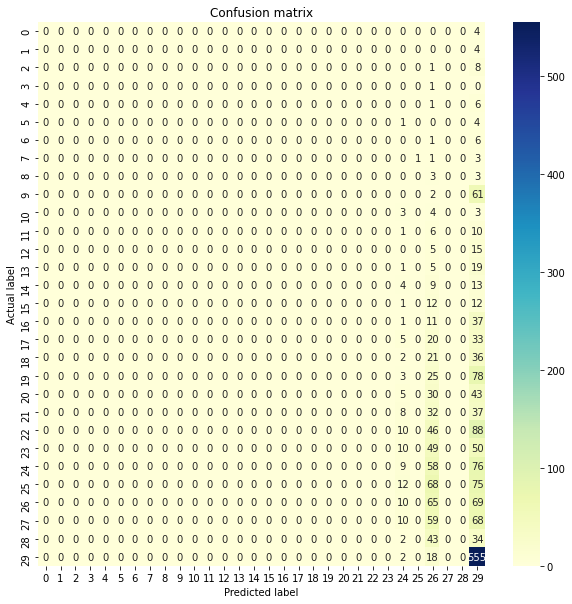

In [ ]:
cnf_matrix = metrics.confusion_matrix(YTest, prediction)

plt.figure(figsize=(10, 10)) 
p = sn.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')

plt.title('Confusion matrix')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')


## Raw Data Comparison

In [ ]:
DT = RandomForestClassifier(max_depth=4, n_estimators=200)
DT.fit(xx_train, yy_train['review_scores_rating'])

pred_train = DT.predict(xx_train)
prediction = DT.predict(xx_test)

print("Train set acc: ", metrics.accuracy_score(yy_train['review_scores_rating'], pred_train))
print("Train set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(yy_train['review_scores_rating'], pred_train, average='weighted'))
print("Test set acc: ", metrics.accuracy_score(yy_test['review_scores_rating'], prediction))
print("Test set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(yy_test['review_scores_rating'], prediction, average='weighted'))

Train set acc:  0.23647932131495228
Train set precision, recall, F-measure:  (0.1663767492121352, 0.23647932131495228, 0.1459333428425953, None)
Test set acc:  0.2106503298774741
Test set precision, recall, F-measure:  (0.09285764827752264, 0.2106503298774741, 0.12557533201722346, None)


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Resample Comparison

In [ ]:
sm = SMOTE()
x_train_tmp, y_train_tmp = sm.fit_sample(x_train, y_train['review_scores_rating'])

In [ ]:
DT = RandomForestClassifier(max_depth=4, n_estimators=200)
DT.fit(x_train_tmp, y_train_tmp)

pred_train = DT.predict(x_train_tmp)
prediction = DT.predict(x_test)

print("Train set acc: ", metrics.accuracy_score(y_train_tmp, pred_train))
print("Train set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(y_train_tmp, pred_train, average='weighted'))
print("Test set acc: ", metrics.accuracy_score(y_test['review_scores_rating'], prediction))
print("Test set precision, recall, F-measure: ", metrics.precision_recall_fscore_support(y_test['review_scores_rating'], prediction, average='weighted'))

Train set acc:  0.22398712885768612
Train set precision, recall, F-measure:  (0.2464993679861344, 0.22398712885768612, 0.1639545546948902, None)
Test set acc:  0.15416860735910573
Test set precision, recall, F-measure:  (0.23665881012676068, 0.15416860735910573, 0.16883071392604299, None)


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Conclusion

*   Digunakan Random Forest Classifier pada model Tree based Classification ini
*   Features Engineering dan Features Selection memberikan hasil yang lebih baik dari pada langsung menggunakan data yang tanpa proses melalui tersebut.
*   Metrik yang digunakan untuk mengukur peforma adalah:
    *   Accuracy score
    *   Precision
    *   Recall
    *   F-1
    *   Confussion Matrix
* Hasil evaluasi metrik menunjukan:
    *   Secara keseluruhan nilai accuracy dari data yang telah di Feature Engineering lebih baik dari pada yang tidak
    *   Features Selection dengan K-Best f_classif() memberikan hasil yang lebih baik dari pada Feature Selection berdasarkan 5 feature dengan nilai absolut korelasi tertinggi
    * Karena adanya kelas yang kurang seimbang, dicoba SMOTE pada train set dan hasilnya menunjukan model tree tidak se-overfitting model KNN dan SVM (dilihat dari nilai metrik yang tidak terlalu berbeda antara test set dan train set)
    * Model menunjukan peforma yang cukup seimbang pada test set dan train set
* Parameter max_depth diatur '4' supaya tidak terjadi overfitting, saat parameter max_depth tidak dibatasi, terjadi overfitting pada model (nilai akurasi di train set dapat mencapai angka 90an tetapi pada test set hanya 20an)
* Jika dibandingkan dengan model KNN dan SVM, model ini tidak memperoleh hasil terbaik pada akurasi, presisi, recall, maupun F-1

# Clustering

# Gaussian Mixture Model

In [ ]:
X = data_pick_copy

In [ ]:
GMM = GaussianMixture(n_components=3).fit(X)
YPredict = GMM.predict(X)

print("Y Predict : ", YPredict)
print("GMM: ", silhouette_score(X, YPredict))

Y Predict :  [0 0 1 ... 1 1 1]
GMM:  -0.1436138349675057


salah satu contoh visualisasi yang cukup bagus dari setiap pasang features yang ada

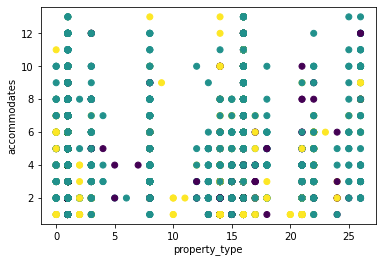

In [ ]:
plt.scatter(X.property_type, X.accommodates,c = YPredict)
plt.xlabel('property_type')
plt.ylabel('accommodates')
plt.show()

visualisasi setiap pasang feature

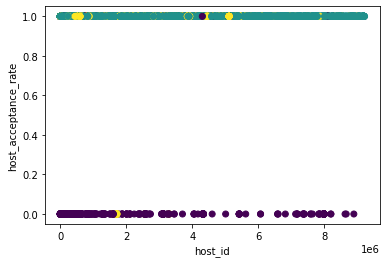

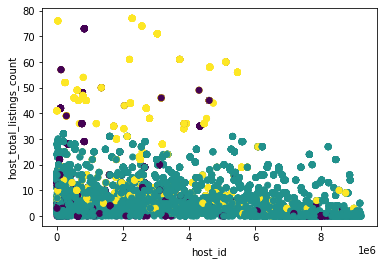

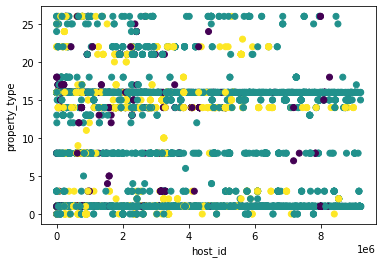

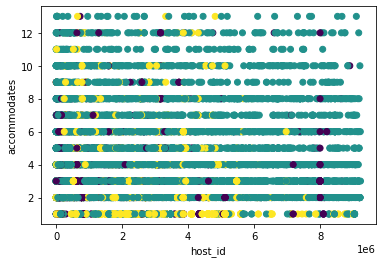

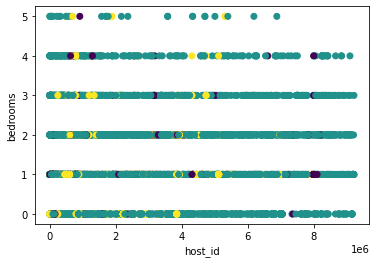

...

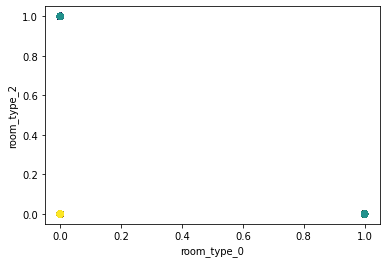

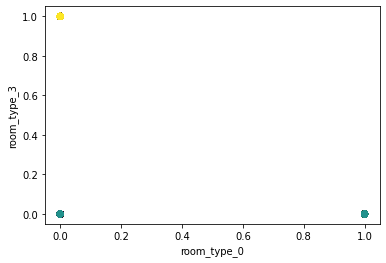

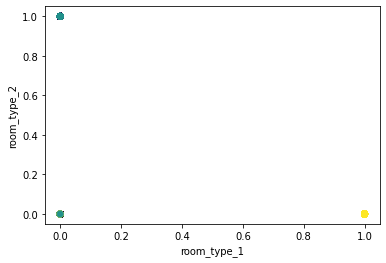

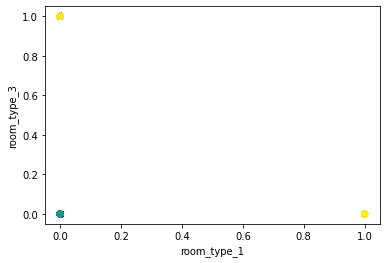

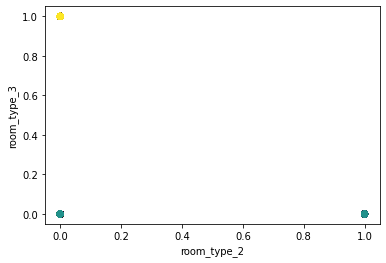

In [ ]:
for i in range(X.shape[1]):
  for j in range(i+1,X.shape[1]):
    plt.scatter(X.iloc[:,i], X.iloc[:,j],c = YPredict)
    plt.xlabel(X.columns[i])
    plt.ylabel(X.columns[j])
    plt.show()

## Conclusion
*   Model Gaussian Mixture mencoba mengcluster data menjadi **3 cluster**
*   Clustering dengan Gaussian Mixture **tidak** menunjukan wilayah kluster yang jelas dilihat dari nilai silhouette_score yang sangat rendah bahkan minus dan visualisasi untuk setiap pasang features

# K-Means Clustering

In [ ]:
X = data_pick_copy

pencarian nilai K yang paling sesuai dengan elbow methods

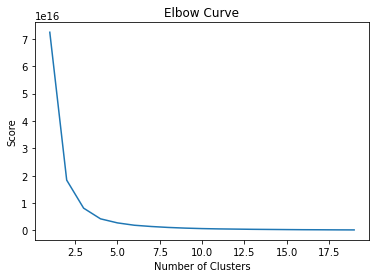

In [ ]:
Ks = range(1, 20)
KMNs = [KMeans(n_clusters=i) for i in Ks]
score = [KMNs[i].fit(X).inertia_ for i in range(len(KMNs))]
plt.plot(Ks, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [ ]:
KMN = KMeans(n_clusters=4).fit(X)
KMNLabels = KMN.labels_
KMNClusterCenters = KMN.cluster_centers_
YPredict = KMN.predict(X)

print("Y Predict : ", YPredict)
print("KMeans: ", silhouette_score(X, YPredict))

Y Predict :  [2 2 2 ... 0 3 3]
KMeans:  0.6136873381367168


salah satu contoh visualisasi yang cukup bagus dari setiap pasang features yang ada

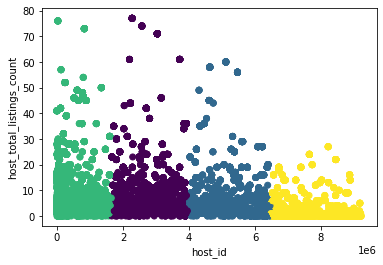

In [ ]:
plt.scatter(X.iloc[:,0], X.iloc[:,2],c = YPredict)
plt.xlabel(X.columns[0])
plt.ylabel(X.columns[2])
plt.show()

visualisasi setiap pasang feature

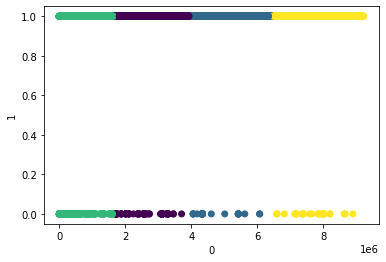

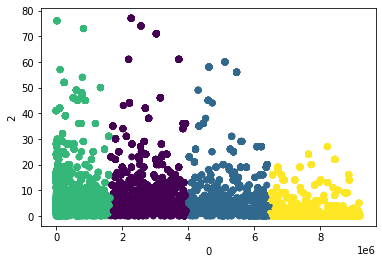

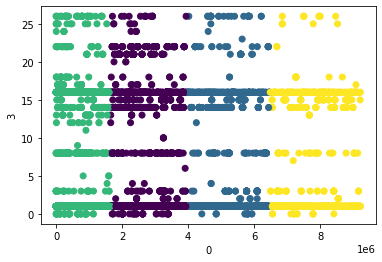

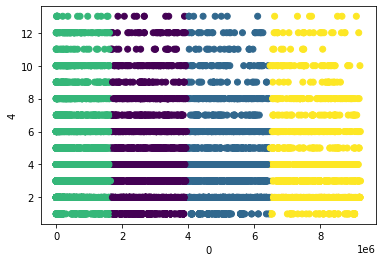

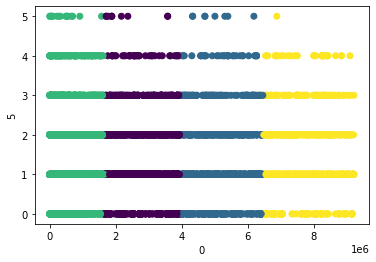

...

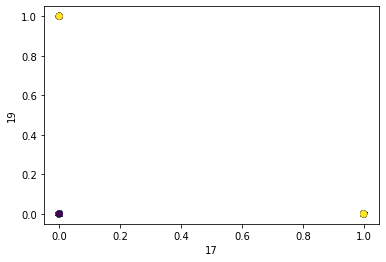

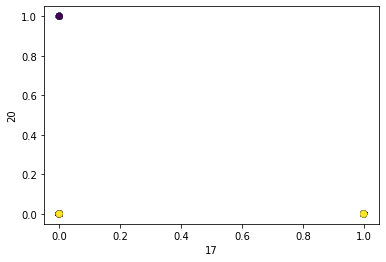

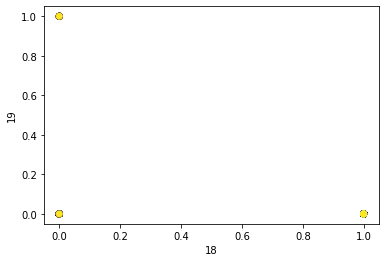

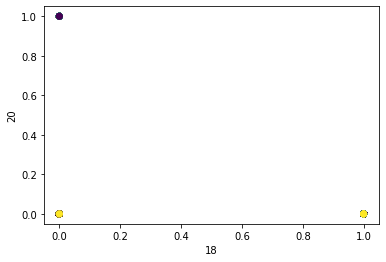

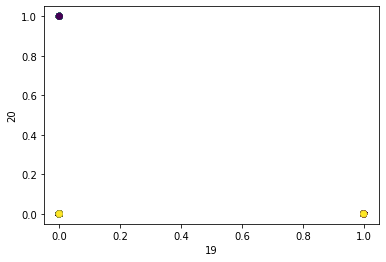

In [ ]:
for i in range(X.shape[1]):
  for j in range(i+1,X.shape[1]):
    plt.scatter(X.iloc[:,i], X.iloc[:,j],c = YPredict)
    plt.xlabel(i)
    plt.ylabel(j)
    plt.show()

## Conclusion
*   Model KMeans mencoba mengcluster data menjadi **4 cluster** (berdasarkan elbow methods yang telah dilakukan)
*   Clustering dengan KMeans menunjukan wilayah kluster yang cukup jelas dilihat dari nilai silhouette_score yang diatas 0.5 dan visualisasi untuk setiap pasang features
* Untuk visualisasi pasangan features, terlihat banyak pasangan features yang terbagi dengan jelas klusternya, tetapi ada juga pasangan features yang tidak jelas pembagian clusternya, mungkin karena features tersebut terlah di one-hot encoding maupun features engineering lainnya